In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

%matplotlib inline

In [2]:
import warnings
warnings.filterwarnings('ignore')

In [3]:
data = pd.read_csv('archive.zip')
data.head()

,Unnamed: 0,arrest_key,arrest_date,pd_desc,ofns_desc,law_code,law_cat_cd,age_group,perp_sex,perp_race,latitude,longitude,arrest_boro,arrest_precinct,jurisdiction_code,:@computed_region_f5dn_yrer,:@computed_region_yeji_bk3q,:@computed_region_92fq_4b7q,:@computed_region_sbqj_enih
0,0,192799737,2019-01-26,SEXUAL ABUSE,SEX CRIMES,PL 1306503,F,45-64,M,BLACK,40.800694,-73.941109,M,25,0.0,7.0,4.0,36.0,16.0
1,1,193260691,2019-02-06,CRIMINAL SALE OF A CONTROLLED SUBSTANCE,CONTROLLED SUBSTANCES OFFENSES,PL 2203400,F,25-44,M,UNKNOWN,40.757839,-73.991212,M,14,0.0,12.0,4.0,10.0,8.0
2,2,149117452,2016-01-06,RAPE 3,RAPE,PL 1302503,F,25-44,M,BLACK,40.648650,-73.950336,K,67,0.0,61.0,2.0,11.0,40.0
3,3,190049060,2018-11-15,RAPE 1,RAPE,PL 1303501,F,25-44,M,BLACK,40.674583,-73.930222,K,77,0.0,16.0,2.0,49.0,49.0
4,4,24288194,2006-09-13,"TRESPASS 3, CRIMINAL",CRIMINAL TRESPASS,PL 140100E,M,45-64,M,BLACK,40.671254,-73.926714,K,77,2.0,16.0,2.0,49.0,49.0


In [4]:
data = data.rename(columns={":@computed_region_f5dn_yrer":"Community_District",
                            ":@computed_region_yeji_bk3q":"Borough_Boundaries",
                            ":@computed_region_92fq_4b7q":"Council_District",
                            ":@computed_region_sbqj_enih":"Police_Precinct"})

In [5]:
data.drop(['Unnamed: 0'], axis = 1, inplace = True)

In [6]:
data.head()

,arrest_key,arrest_date,pd_desc,ofns_desc,law_code,law_cat_cd,age_group,perp_sex,perp_race,latitude,longitude,arrest_boro,arrest_precinct,jurisdiction_code,Community_District,Borough_Boundaries,Council_District,Police_Precinct
0,192799737,2019-01-26,SEXUAL ABUSE,SEX CRIMES,PL 1306503,F,45-64,M,BLACK,40.800694,-73.941109,M,25,0.0,7.0,4.0,36.0,16.0
1,193260691,2019-02-06,CRIMINAL SALE OF A CONTROLLED SUBSTANCE,CONTROLLED SUBSTANCES OFFENSES,PL 2203400,F,25-44,M,UNKNOWN,40.757839,-73.991212,M,14,0.0,12.0,4.0,10.0,8.0
2,149117452,2016-01-06,RAPE 3,RAPE,PL 1302503,F,25-44,M,BLACK,40.648650,-73.950336,K,67,0.0,61.0,2.0,11.0,40.0
3,190049060,2018-11-15,RAPE 1,RAPE,PL 1303501,F,25-44,M,BLACK,40.674583,-73.930222,K,77,0.0,16.0,2.0,49.0,49.0
4,24288194,2006-09-13,"TRESPASS 3, CRIMINAL",CRIMINAL TRESPASS,PL 140100E,M,45-64,M,BLACK,40.671254,-73.926714,K,77,2.0,16.0,2.0,49.0,49.0


In [7]:
data.shape

(3881989, 18)

In [8]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3881989 entries, 0 to 3881988
Data columns (total 18 columns):
 #   Column              Dtype  
---  ------              -----  
 0   arrest_key          int64  
 1   arrest_date         object 
 2   pd_desc             object 
 3   ofns_desc           object 
 4   law_code            object 
 5   law_cat_cd          object 
 6   age_group           object 
 7   perp_sex            object 
 8   perp_race           object 
 9   latitude            float64
 10  longitude           float64
 11  arrest_boro         object 
 12  arrest_precinct     int64  
 13  jurisdiction_code   float64
 14  Community_District  float64
 15  Borough_Boundaries  float64
 16  Council_District    float64
 17  Police_Precinct     float64
dtypes: float64(7), int64(2), object(9)
memory usage: 533.1+ MB


In [9]:
data.isnull().sum()

arrest_key                0
arrest_date               0
pd_desc                   0
ofns_desc                 0
law_code                  0
law_cat_cd            13360
age_group                 0
perp_sex                  0
perp_race                 0
latitude                  0
longitude                 0
arrest_boro               0
arrest_precinct           0
jurisdiction_code         0
Community_District     5976
Borough_Boundaries     5980
Council_District       5976
Police_Precinct        5977
dtype: int64

In [10]:
data = data.dropna()
data.head()

,arrest_key,arrest_date,pd_desc,ofns_desc,law_code,law_cat_cd,age_group,perp_sex,perp_race,latitude,longitude,arrest_boro,arrest_precinct,jurisdiction_code,Community_District,Borough_Boundaries,Council_District,Police_Precinct
0,192799737,2019-01-26,SEXUAL ABUSE,SEX CRIMES,PL 1306503,F,45-64,M,BLACK,40.800694,-73.941109,M,25,0.0,7.0,4.0,36.0,16.0
1,193260691,2019-02-06,CRIMINAL SALE OF A CONTROLLED SUBSTANCE,CONTROLLED SUBSTANCES OFFENSES,PL 2203400,F,25-44,M,UNKNOWN,40.757839,-73.991212,M,14,0.0,12.0,4.0,10.0,8.0
2,149117452,2016-01-06,RAPE 3,RAPE,PL 1302503,F,25-44,M,BLACK,40.648650,-73.950336,K,67,0.0,61.0,2.0,11.0,40.0
3,190049060,2018-11-15,RAPE 1,RAPE,PL 1303501,F,25-44,M,BLACK,40.674583,-73.930222,K,77,0.0,16.0,2.0,49.0,49.0
4,24288194,2006-09-13,"TRESPASS 3, CRIMINAL",CRIMINAL TRESPASS,PL 140100E,M,45-64,M,BLACK,40.671254,-73.926714,K,77,2.0,16.0,2.0,49.0,49.0


In [11]:
data.shape

(3862648, 18)

In [12]:
# Need to split arrest date into separate columns
time_crime = data.copy()

# Convert 'arrest_date' column to datetime using pd.to_datetime
time_crime['arrest_date'] = pd.to_datetime(time_crime['arrest_date'], format='%Y-%m-%d')

time_crime.head()

,arrest_key,arrest_date,pd_desc,ofns_desc,law_code,law_cat_cd,age_group,perp_sex,perp_race,latitude,longitude,arrest_boro,arrest_precinct,jurisdiction_code,Community_District,Borough_Boundaries,Council_District,Police_Precinct
0,192799737,2019-01-26,SEXUAL ABUSE,SEX CRIMES,PL 1306503,F,45-64,M,BLACK,40.800694,-73.941109,M,25,0.0,7.0,4.0,36.0,16.0
1,193260691,2019-02-06,CRIMINAL SALE OF A CONTROLLED SUBSTANCE,CONTROLLED SUBSTANCES OFFENSES,PL 2203400,F,25-44,M,UNKNOWN,40.757839,-73.991212,M,14,0.0,12.0,4.0,10.0,8.0
2,149117452,2016-01-06,RAPE 3,RAPE,PL 1302503,F,25-44,M,BLACK,40.648650,-73.950336,K,67,0.0,61.0,2.0,11.0,40.0
3,190049060,2018-11-15,RAPE 1,RAPE,PL 1303501,F,25-44,M,BLACK,40.674583,-73.930222,K,77,0.0,16.0,2.0,49.0,49.0
4,24288194,2006-09-13,"TRESPASS 3, CRIMINAL",CRIMINAL TRESPASS,PL 140100E,M,45-64,M,BLACK,40.671254,-73.926714,K,77,2.0,16.0,2.0,49.0,49.0


In [13]:
# Find the day of each of 'ARREST_DATE'
time_crime['Day_of_week'] = time_crime['arrest_date'].dt.day_name()
time_crime.head()

,arrest_key,arrest_date,pd_desc,ofns_desc,law_code,law_cat_cd,age_group,perp_sex,perp_race,latitude,longitude,arrest_boro,arrest_precinct,jurisdiction_code,Community_District,Borough_Boundaries,Council_District,Police_Precinct,Day_of_week
0,192799737,2019-01-26,SEXUAL ABUSE,SEX CRIMES,PL 1306503,F,45-64,M,BLACK,40.800694,-73.941109,M,25,0.0,7.0,4.0,36.0,16.0,Saturday
1,193260691,2019-02-06,CRIMINAL SALE OF A CONTROLLED SUBSTANCE,CONTROLLED SUBSTANCES OFFENSES,PL 2203400,F,25-44,M,UNKNOWN,40.757839,-73.991212,M,14,0.0,12.0,4.0,10.0,8.0,Wednesday
2,149117452,2016-01-06,RAPE 3,RAPE,PL 1302503,F,25-44,M,BLACK,40.648650,-73.950336,K,67,0.0,61.0,2.0,11.0,40.0,Wednesday
3,190049060,2018-11-15,RAPE 1,RAPE,PL 1303501,F,25-44,M,BLACK,40.674583,-73.930222,K,77,0.0,16.0,2.0,49.0,49.0,Thursday
4,24288194,2006-09-13,"TRESPASS 3, CRIMINAL",CRIMINAL TRESPASS,PL 140100E,M,45-64,M,BLACK,40.671254,-73.926714,K,77,2.0,16.0,2.0,49.0,49.0,Wednesday


In [14]:
# Create new columns for year, month, and day

time_crime['Year'] = time_crime['arrest_date'].dt.year
time_crime['Month'] = time_crime['arrest_date'].dt.month
time_crime['Day'] = time_crime['arrest_date'].dt.day

time_crime.head()

,arrest_key,arrest_date,pd_desc,ofns_desc,law_code,law_cat_cd,age_group,perp_sex,perp_race,latitude,...,arrest_precinct,jurisdiction_code,Community_District,Borough_Boundaries,Council_District,Police_Precinct,Day_of_week,Year,Month,Day
0,192799737,2019-01-26,SEXUAL ABUSE,SEX CRIMES,PL 1306503,F,45-64,M,BLACK,40.800694,...,25,0.0,7.0,4.0,36.0,16.0,Saturday,2019,1,26
1,193260691,2019-02-06,CRIMINAL SALE OF A CONTROLLED SUBSTANCE,CONTROLLED SUBSTANCES OFFENSES,PL 2203400,F,25-44,M,UNKNOWN,40.757839,...,14,0.0,12.0,4.0,10.0,8.0,Wednesday,2019,2,6
2,149117452,2016-01-06,RAPE 3,RAPE,PL 1302503,F,25-44,M,BLACK,40.648650,...,67,0.0,61.0,2.0,11.0,40.0,Wednesday,2016,1,6
3,190049060,2018-11-15,RAPE 1,RAPE,PL 1303501,F,25-44,M,BLACK,40.674583,...,77,0.0,16.0,2.0,49.0,49.0,Thursday,2018,11,15
4,24288194,2006-09-13,"TRESPASS 3, CRIMINAL",CRIMINAL TRESPASS,PL 140100E,M,45-64,M,BLACK,40.671254,...,77,2.0,16.0,2.0,49.0,49.0,Wednesday,2006,9,13


In [15]:
# Drop the 'ARREST_DATE' column
time_crime = time_crime.drop(['arrest_key', 'arrest_date'], axis=1)

In [16]:
time_crime['age_group'].unique()

array(['45-64', '25-44', '18-24', '<18', '65+'], dtype=object)

In [17]:
time_crime['perp_sex'].unique()

array(['M', 'F'], dtype=object)

In [18]:
# List of variables to map

var =  ['perp_sex']

# Defining the map function
def binary_map(x):
    return x.map({"M": 1, "F": 0})

# Applying the function to the housing list
time_crime[var] = time_crime[var].apply(binary_map)

In [19]:
time_crime['arrest_boro'].unique()

array(['M', 'K', 'B', 'Q', 'S'], dtype=object)

In [20]:
time_crime['law_cat_cd'].unique()

array(['F', 'M', 'V', 'I'], dtype=object)

In [21]:
# Creating a feature for the season
time_crime['Season'] = time_crime['Month'].map({1: 'Winter', 2: 'Winter', 3: 'Spring', 4: 'Spring',
                                                             5: 'Spring', 6: 'Summer', 7: 'Summer', 8: 'Summer',
                                                             9: 'Fall', 10: 'Fall', 11: 'Fall', 12: 'Winter'})

In [22]:
# Creating a feature for Weekend/weekdays
time_crime['Week_day_end'] = time_crime['Day_of_week'].map({'Sunday': 'Weekend','Monday': 'Weekday', 'Tuesday': 'Weekday',  
                                                           'Wednesday': 'Weekday', 'Thursday': 'Weekday', 'Friday': 'Weekday',
                                                           'Saturday': 'Weekend'})

In [23]:
pd.set_option('display.max_columns', None)
time_crime.head(20)

,pd_desc,ofns_desc,law_code,law_cat_cd,age_group,perp_sex,perp_race,latitude,longitude,arrest_boro,arrest_precinct,jurisdiction_code,Community_District,Borough_Boundaries,Council_District,Police_Precinct,Day_of_week,Year,Month,Day,Season,Week_day_end
0,SEXUAL ABUSE,SEX CRIMES,PL 1306503,F,45-64,1,BLACK,40.800694,-73.941109,M,25,0.0,7.0,4.0,36.0,16.0,Saturday,2019,1,26,Winter,Weekend
1,CRIMINAL SALE OF A CONTROLLED SUBSTANCE,CONTROLLED SUBSTANCES OFFENSES,PL 2203400,F,25-44,1,UNKNOWN,40.757839,-73.991212,M,14,0.0,12.0,4.0,10.0,8.0,Wednesday,2019,2,6,Winter,Weekday
2,RAPE 3,RAPE,PL 1302503,F,25-44,1,BLACK,40.648650,-73.950336,K,67,0.0,61.0,2.0,11.0,40.0,Wednesday,2016,1,6,Winter,Weekday
3,RAPE 1,RAPE,PL 1303501,F,25-44,1,BLACK,40.674583,-73.930222,K,77,0.0,16.0,2.0,49.0,49.0,Thursday,2018,11,15,Fall,Weekday
4,"TRESPASS 3, CRIMINAL",CRIMINAL TRESPASS,PL 140100E,M,45-64,1,BLACK,40.671254,-73.926714,K,77,2.0,16.0,2.0,49.0,49.0,Wednesday,2006,9,13,Fall,Weekday
5,RAPE 3,RAPE,PL 1302503,F,45-64,1,WHITE HISPANIC,40.716196,-73.997491,M,5,0.0,70.0,4.0,32.0,2.0,Wednesday,2018,10,24,Fall,Weekday
6,RAPE 1,RAPE,PL 1303501,F,45-64,1,BLACK HISPANIC,40.674583,-73.930222,K,77,0.0,16.0,2.0,49.0,49.0,Tuesday,2019,4,23,Spring,Weekday
7,"SEXUAL ABUSE 3,2",SEX CRIMES,PL 13052A1,M,25-44,1,BLACK,40.883383,-73.902333,B,50,0.0,48.0,5.0,40.0,33.0,Saturday,2019,5,4,Spring,Weekend
8,"SEXUAL ABUSE 3,2",SEX CRIMES,PL 13052A1,M,45-64,0,BLACK,40.814850,-73.956682,M,26,0.0,37.0,4.0,23.0,17.0,Thursday,2019,5,23,Spring,Weekday
9,ASSAULT 3,ASSAULT 3 & RELATED OFFENSES,PL 1200000,M,25-44,1,WHITE HISPANIC,40.764434,-73.988266,M,18,0.0,12.0,4.0,10.0,10.0,Tuesday,2018,10,23,Fall,Weekday


In [24]:
from sklearn import preprocessing

In [25]:
crime_time = time_crime.copy()

# Encode labels with value between 0 and n_classes-1.
le = preprocessing.LabelEncoder()


# Fit and Transform
# Use df.apply() to apply le.fit_transform to all columns
crime_df = crime_time.apply(le.fit_transform)
crime_df.head(5)

,pd_desc,ofns_desc,law_code,law_cat_cd,age_group,perp_sex,perp_race,latitude,longitude,arrest_boro,arrest_precinct,jurisdiction_code,Community_District,Borough_Boundaries,Council_District,Police_Precinct,Day_of_week,Year,Month,Day,Season,Week_day_end
0,339,88,663,0,2,1,2,84236,40403,2,15,0,6,3,35,15,2,13,0,25,3,1
1,89,13,1327,0,1,1,5,74668,20413,2,7,0,11,3,9,7,6,13,1,5,3,0
2,313,86,619,0,1,1,2,26705,35932,1,39,0,60,1,10,39,6,10,0,5,3,0
3,311,86,624,0,1,1,2,36001,45300,1,48,0,15,1,48,48,4,12,10,14,0,0
4,382,16,751,2,2,1,2,34290,46819,1,48,2,15,1,48,48,6,0,8,12,0,0


In [26]:
# Rescalling feature
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()

In [27]:
num_vars = ['Day_of_week', 'Year', 'Month', 'Day', 'pd_desc', 'ofns_desc', 'law_code', 'law_cat_cd', 'age_group', 
            'perp_race', 'longitude', 'arrest_boro', 'arrest_precinct','jurisdiction_code','Community_District', 
            'Borough_Boundaries', 'Council_District', 'Police_Precinct','Season', 'Week_day_end']
                      
crime_df[num_vars] = scaler.fit_transform(crime_df[num_vars])

crime_df.head(20)

,pd_desc,ofns_desc,law_code,law_cat_cd,age_group,perp_sex,perp_race,latitude,longitude,arrest_boro,arrest_precinct,jurisdiction_code,Community_District,Borough_Boundaries,Council_District,Police_Precinct,Day_of_week,Year,Month,Day,Season,Week_day_end
0,0.816867,0.907216,0.287636,0.000000,0.50,1,0.285714,84236,0.378086,0.50,0.197368,0.000000,0.085714,0.75,0.70,0.197368,0.333333,1.000000,0.000000,0.833333,1.000000,1.0
1,0.214458,0.134021,0.575705,0.000000,0.25,1,0.714286,74668,0.191022,0.50,0.092105,0.000000,0.157143,0.75,0.18,0.092105,1.000000,1.000000,0.090909,0.166667,1.000000,0.0
2,0.754217,0.886598,0.268547,0.000000,0.25,1,0.285714,26705,0.336247,0.25,0.513158,0.000000,0.857143,0.25,0.20,0.513158,1.000000,0.769231,0.000000,0.166667,1.000000,0.0
3,0.749398,0.886598,0.270716,0.000000,0.25,1,0.285714,36001,0.423911,0.25,0.631579,0.000000,0.214286,0.25,0.96,0.631579,0.666667,0.923077,0.909091,0.466667,0.000000,0.0
4,0.920482,0.164948,0.325813,0.666667,0.50,1,0.285714,34290,0.438126,0.25,0.631579,0.076923,0.214286,0.25,0.96,0.631579,1.000000,0.000000,0.727273,0.400000,0.000000,0.0
5,0.754217,0.886598,0.268547,0.000000,0.50,1,1.000000,57713,0.169883,0.50,0.013158,0.000000,0.985714,0.75,0.62,0.013158,1.000000,0.923077,0.818182,0.766667,0.000000,0.0
6,0.749398,0.886598,0.270716,0.000000,0.50,1,0.428571,36001,0.423911,0.25,0.631579,0.000000,0.214286,0.25,0.96,0.631579,0.833333,1.000000,0.272727,0.733333,0.333333,0.0
7,0.821687,0.907216,0.283731,0.666667,0.25,1,0.285714,100709,0.548960,0.00,0.421053,0.000000,0.671429,1.00,0.78,0.421053,0.333333,1.000000,0.363636,0.100000,0.333333,1.0
8,0.821687,0.907216,0.283731,0.666667,0.50,0,0.285714,86544,0.308192,0.50,0.210526,0.000000,0.514286,0.75,0.44,0.210526,0.666667,1.000000,0.363636,0.733333,0.333333,0.0
9,0.062651,0.082474,0.157050,0.666667,0.25,1,1.000000,77333,0.201231,0.50,0.118421,0.000000,0.157143,0.75,0.18,0.118421,0.833333,0.923077,0.818182,0.733333,0.000000,0.0


In [28]:
# Checking for outliers
num_crime = crime_df.copy()

num_crime.describe(percentiles=[.25, .5, .75, .90, .95, .99])

,pd_desc,ofns_desc,law_code,law_cat_cd,age_group,perp_sex,perp_race,latitude,longitude,arrest_boro,arrest_precinct,jurisdiction_code,Community_District,Borough_Boundaries,Council_District,Police_Precinct,Day_of_week,Year,Month,Day,Season,Week_day_end
count,3.862648e+06,3.862648e+06,3.862648e+06,3.862648e+06,3.862648e+06,3.862648e+06,3.862648e+06,3.862648e+06,3.862648e+06,3.862648e+06,3.862648e+06,3.862648e+06,3.862648e+06,3.862648e+06,3.862648e+06,3.862648e+06,3.862648e+06,3.862648e+06,3.862648e+06,3.862648e+06,3.862648e+06,3.862648e+06
mean,5.194856e-01,4.492825e-01,4.659325e-01,5.058072e-01,2.964633e-01,8.320253e-01,5.495975e-01,6.213576e+04,4.551520e-01,3.804633e-01,4.793812e-01,2.011928e-02,5.124400e-01,5.947507e-01,5.538596e-01,4.799879e-01,5.284223e-01,4.523183e-01,4.846876e-01,4.806517e-01,4.963102e-01,2.320701e-01
std,3.153767e-01,3.172535e-01,2.226923e-01,3.168045e-01,2.726771e-01,3.738438e-01,3.268486e-01,2.751568e+04,2.257873e-01,2.841005e-01,2.803402e-01,9.679999e-02,2.995783e-01,3.019347e-01,2.829807e-01,2.802438e-01,3.479712e-01,2.918627e-01,3.094749e-01,2.895397e-01,3.673966e-01,4.221535e-01
min,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
25%,1.662651e-01,1.752577e-01,3.305857e-01,0.000000e+00,0.000000e+00,1.000000e+00,2.857143e-01,3.893000e+04,2.706575e-01,2.500000e-01,2.631579e-01,0.000000e+00,2.285714e-01,2.500000e-01,3.200000e-01,2.631579e-01,1.666667e-01,2.307692e-01,1.818182e-01,2.333333e-01,3.333333e-01,0.000000e+00
50%,5.325301e-01,2.886598e-01,4.420824e-01,6.666667e-01,2.500000e-01,1.000000e+00,2.857143e-01,6.780050e+04,4.423649e-01,2.500000e-01,4.473684e-01,0.000000e+00,5.714286e-01,5.000000e-01,6.000000e-01,4.473684e-01,5.000000e-01,4.615385e-01,4.545455e-01,4.666667e-01,3.333333e-01,0.000000e+00
75%,8.578313e-01,7.835052e-01,5.991323e-01,6.666667e-01,5.000000e-01,1.000000e+00,1.000000e+00,8.684100e+04,6.137074e-01,5.000000e-01,6.973684e-01,0.000000e+00,7.714286e-01,7.500000e-01,7.800000e-01,6.973684e-01,8.333333e-01,6.923077e-01,7.272727e-01,7.333333e-01,6.666667e-01,0.000000e+00
90%,9.108434e-01,8.556701e-01,8.160521e-01,6.666667e-01,5.000000e-01,1.000000e+00,1.000000e+00,9.489200e+04,7.845633e-01,7.500000e-01,8.815789e-01,3.846154e-02,9.142857e-01,1.000000e+00,9.400000e-01,8.947368e-01,1.000000e+00,8.461538e-01,9.090909e-01,9.000000e-01,1.000000e+00,1.000000e+00
95%,9.204819e-01,9.072165e-01,8.845987e-01,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,9.778500e+04,8.734630e-01,7.500000e-01,9.473684e-01,7.692308e-02,9.714286e-01,1.000000e+00,9.600000e-01,9.473684e-01,1.000000e+00,9.230769e-01,1.000000e+00,9.333333e-01,1.000000e+00,1.000000e+00
99%,9.879518e-01,1.000000e+00,9.514100e-01,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.011330e+05,9.601636e-01,1.000000e+00,9.868421e-01,6.538462e-01,1.000000e+00,1.000000e+00,1.000000e+00,9.868421e-01,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00


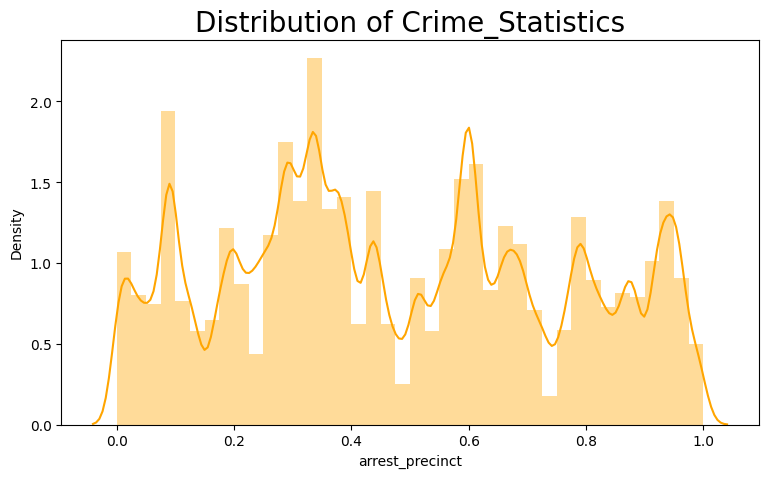

In [29]:
import warnings
warnings.filterwarnings("ignore")

plt.figure(figsize = [9,5])
sns.distplot(num_crime.arrest_precinct,  bins = 40, color = "orange")
plt.title("Distribution of Crime_Statistics", fontsize = 20, fontweight = 10, verticalalignment = 'baseline')

plt.show()

In [30]:
# Remove outliers

def remove_outliers(crime_df, P):
    q25 = np.percentile(crime_df[P], 25)
    q75 = np.percentile(crime_df[P], 75)
    iqr = q75 - q25
    cut_off = iqr * 1.5
    lower, upper = 1, (q75 + cut_off)
    data_outlier = crime_df[(crime_df[P] < upper) & (crime_df[P] > lower)]
    print(f"Outliers of {P} are removed.\n")
    return data_outlier

In [31]:
data_outlier = remove_outliers(crime_df, 'arrest_precinct')

Outliers of arrest_precinct are removed.



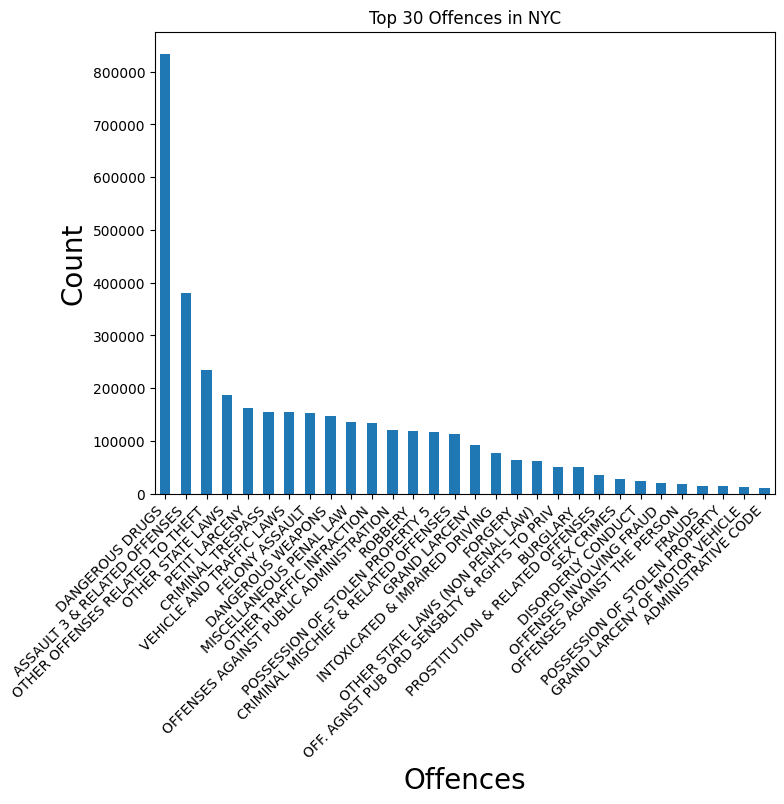

In [32]:
# Crime type distribution
nameplot = time_crime['ofns_desc'].value_counts().head(30).plot.bar(title='Top 30 Offences in NYC', figsize=(8,6))
nameplot.set_xlabel('Offences', size=20)
nameplot.set_ylabel('Count', size=20)

# Use set_xticklabels to rotate and display only 30 offenses
nameplot.set_xticklabels(nameplot.get_xticklabels(), rotation=45, ha="right")

plt.ticklabel_format(style='plain', axis='y')

plt.show()

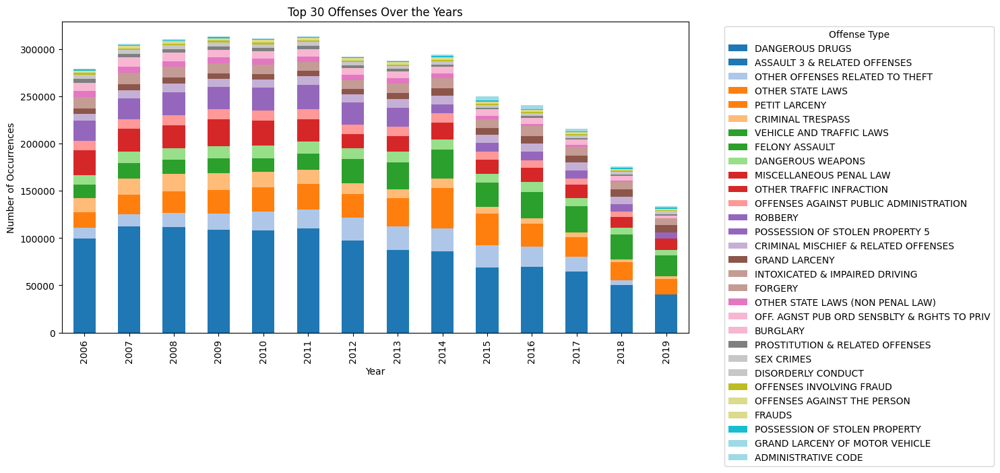

In [33]:
# Group by 'Year' and 'OFNS_DESC' to get counts for each offense in each year
offense_counts = time_crime.groupby(['Year', 'ofns_desc']).size().unstack(fill_value=0)

# Get the top 30 offenses based on the total occurrences across all years
top_30_offenses = offense_counts.sum(axis=0).sort_values(ascending=False).head(30).index

# Filter the data for the top 30 offenses
filtered_offense_counts = offense_counts[top_30_offenses]

# Plot stacked bar chart for the top 30 offenses with distinct colors
filtered_offense_counts.plot(kind='bar', stacked=True, colormap='tab20', figsize=(12, 6))

# Adding labels and title
plt.xlabel('Year')
plt.ylabel('Number of Occurrences')
plt.title('Top 30 Offenses Over the Years')

# Show the plot
plt.legend(title='Offense Type', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

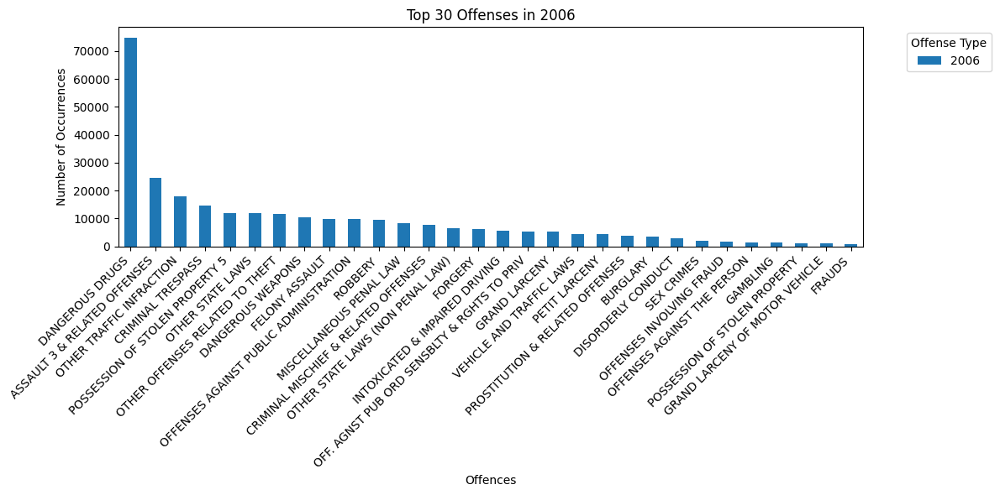

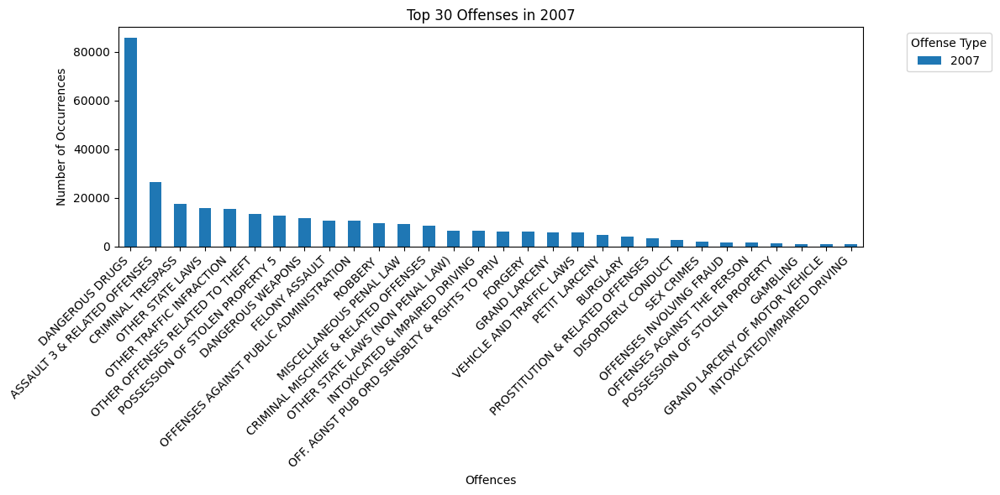

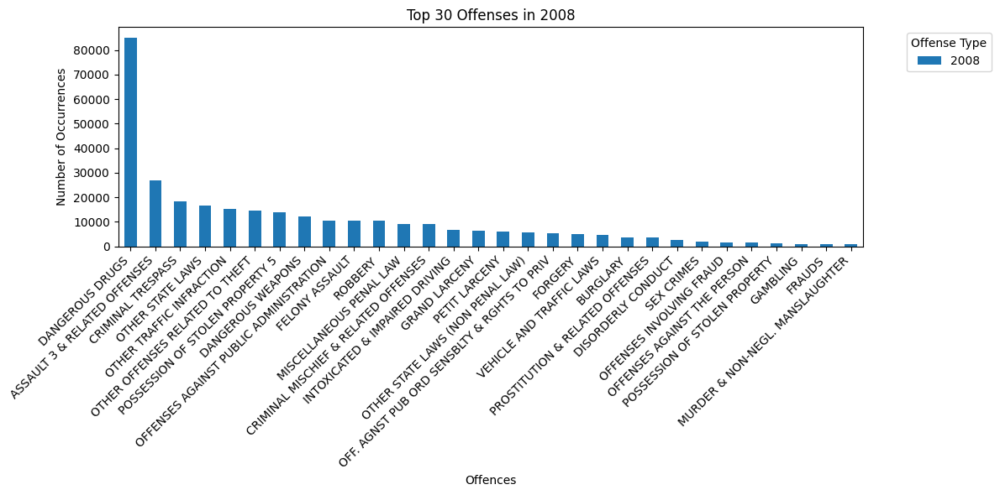

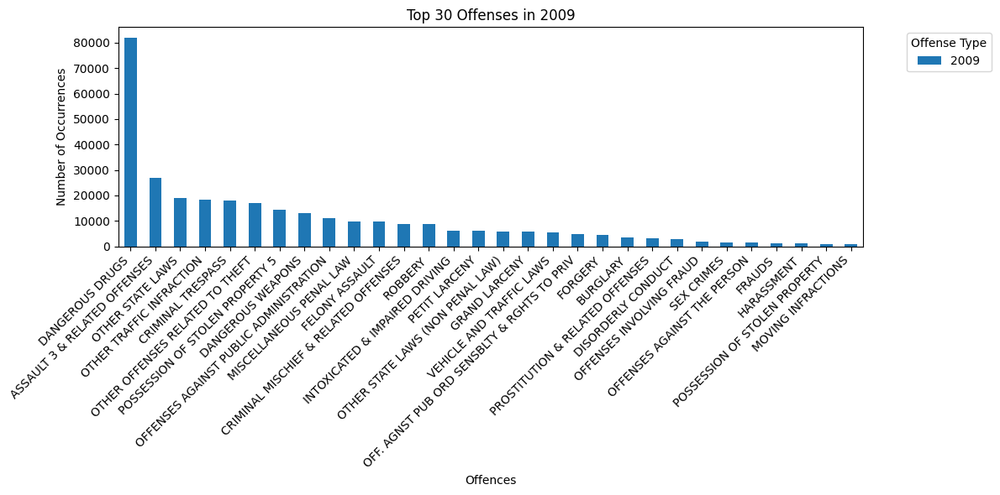

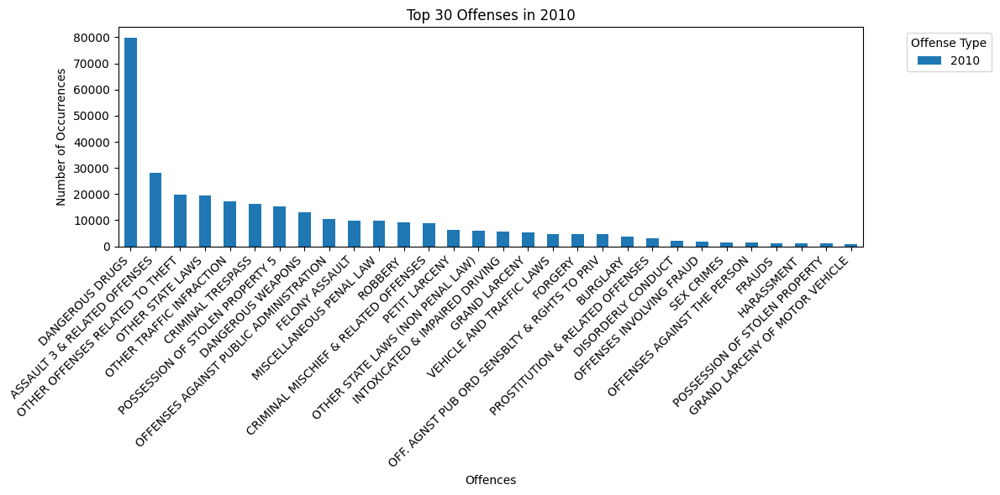

...

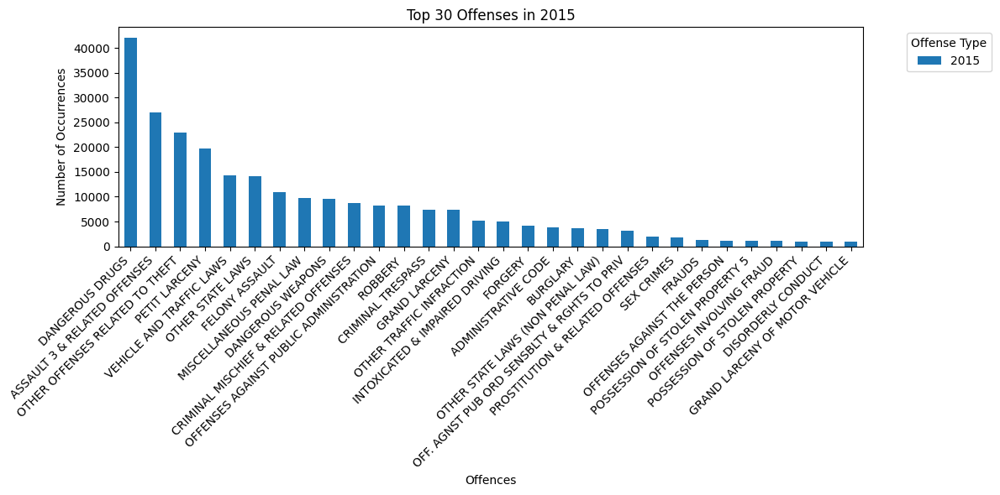

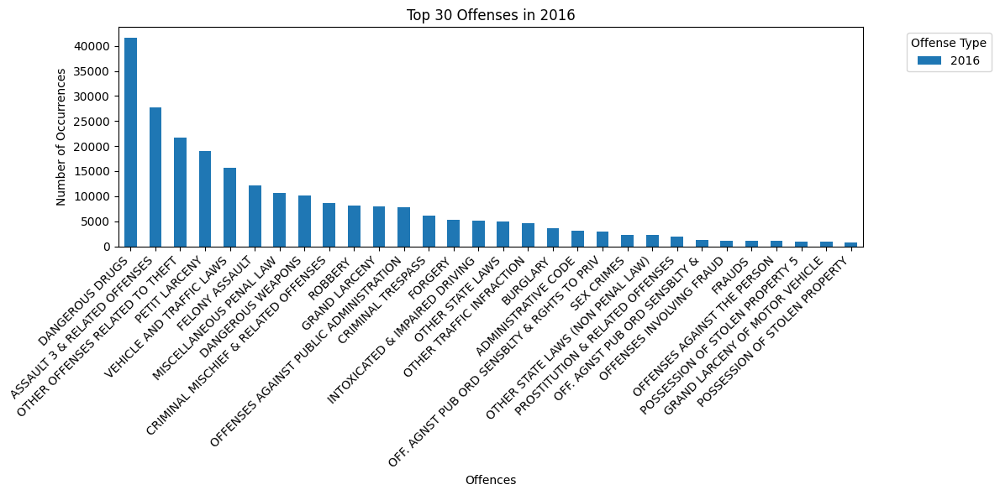

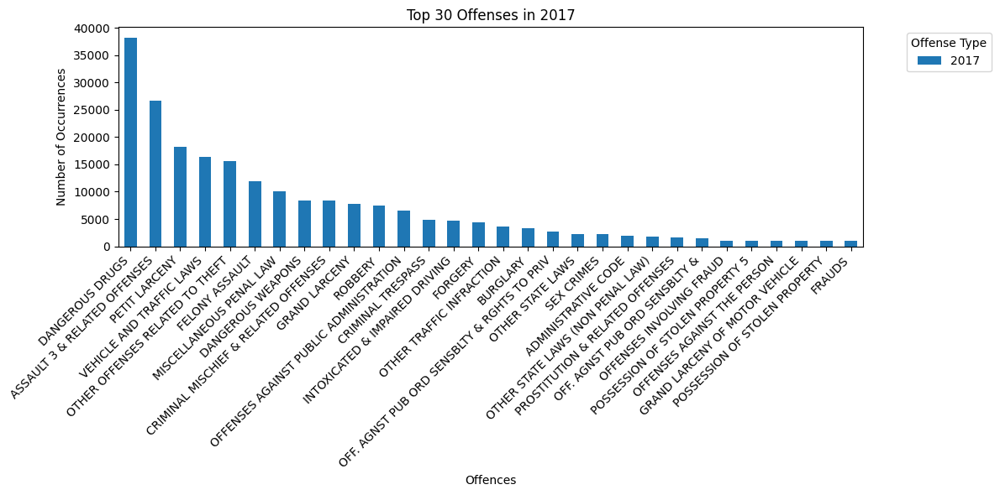

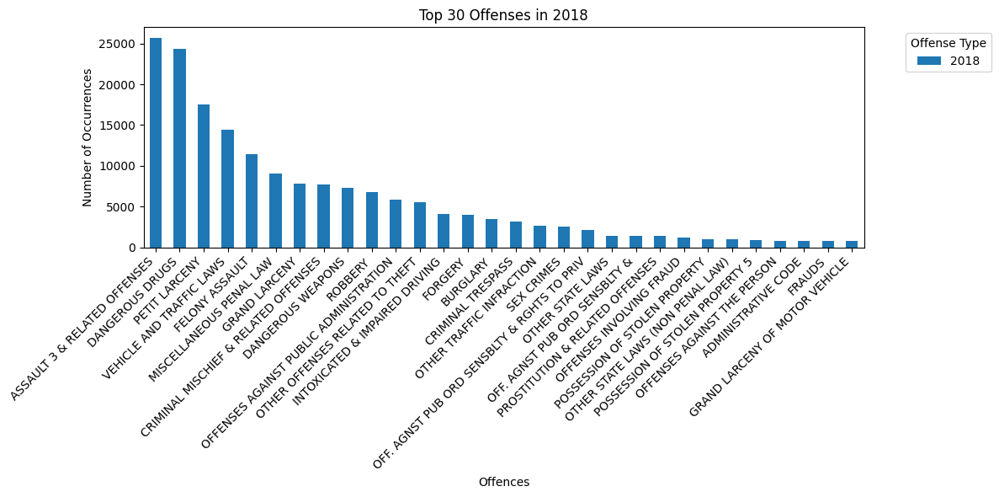

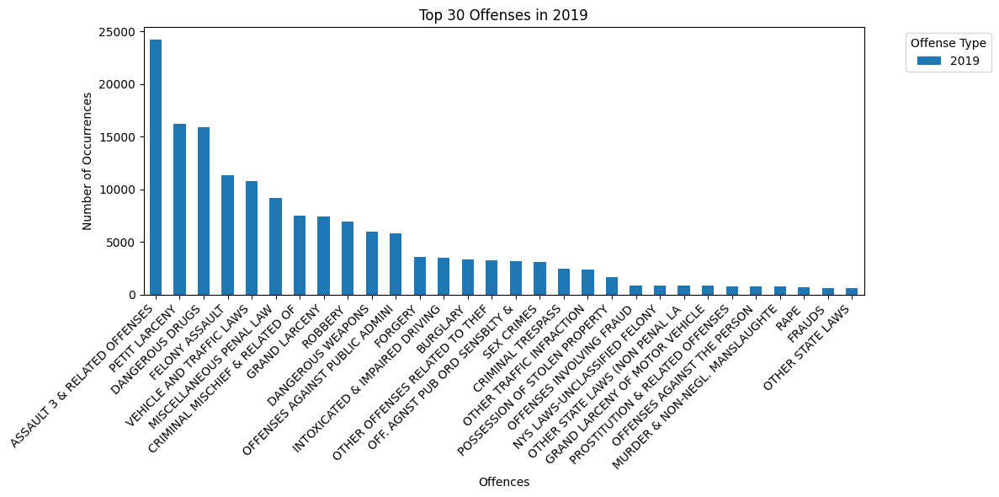

In [34]:
# Get the top 30 offenses for each year in descending order
top_30_offenses_by_year = offense_counts.groupby('Year').sum().apply(lambda x: x.sort_values(ascending=False).index[:30], axis=1)

# Plot grouped bar chart for each year and top 30 offenses
for year, top_offenses in top_30_offenses_by_year.items():  # Change iteritems() to items()
    year_data = offense_counts.loc[year, top_offenses]
    
    # Plot for each year
    fig, ax = plt.subplots(figsize=(12, 6))
    year_data.plot(kind='bar', stacked=True, colormap='tab20', ax=ax)
    
    # Adding labels and title
    plt.xlabel('Offences')
    plt.ylabel('Number of Occurrences')
    plt.title(f'Top 30 Offenses in {year}')
    plt.xticks(rotation=45, ha='right')
    
    # Show the plot
    plt.legend(title='Offense Type', bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.tight_layout()
    plt.show()

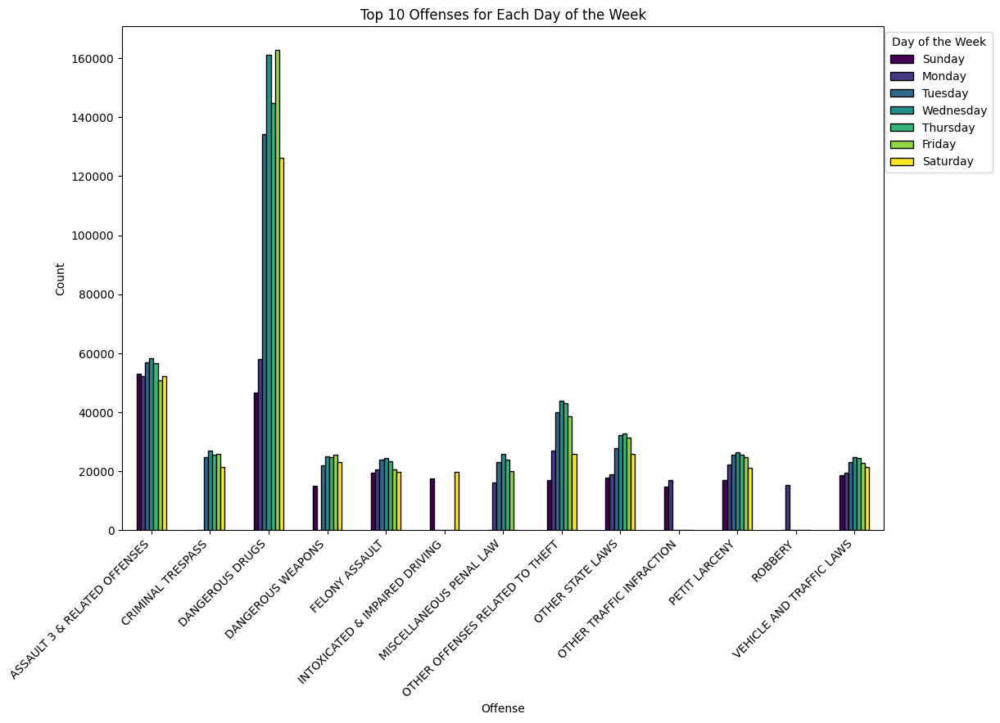

In [35]:
# Define the order of days
day_order = ['Sunday', 'Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday']

# Convert 'Day_of_week' to a categorical variable with the specified order
time_crime['Day_of_week'] = pd.Categorical(time_crime['Day_of_week'], categories=day_order, ordered=True)

# Group by 'Day_of_week' and count occurrences of each offense
offense_counts = time_crime.groupby(['Day_of_week', 'ofns_desc']).size().reset_index(name='Count')

# Sort by count in descending order for each day
offense_counts = offense_counts.sort_values(by=['Day_of_week', 'Count'], ascending=[True, False])

# Get the top 10 offenses for each day
top_10_offenses = offense_counts.groupby('Day_of_week').head(10)

# Pivot the table for easier plotting
pivot_table = top_10_offenses.pivot(index='ofns_desc', columns='Day_of_week', values='Count').fillna(0)

# Plotting
ax = pivot_table.plot(kind='bar', figsize=(12, 8), colormap='viridis', edgecolor='black')

# Rotate x-axis labels
plt.xticks(rotation=45, ha='right')

plt.title('Top 10 Offenses for Each Day of the Week')
plt.xlabel('Offense')
plt.ylabel('Count')
plt.legend(title='Day of the Week', loc='upper right', bbox_to_anchor=(1.15, 1))
plt.show()

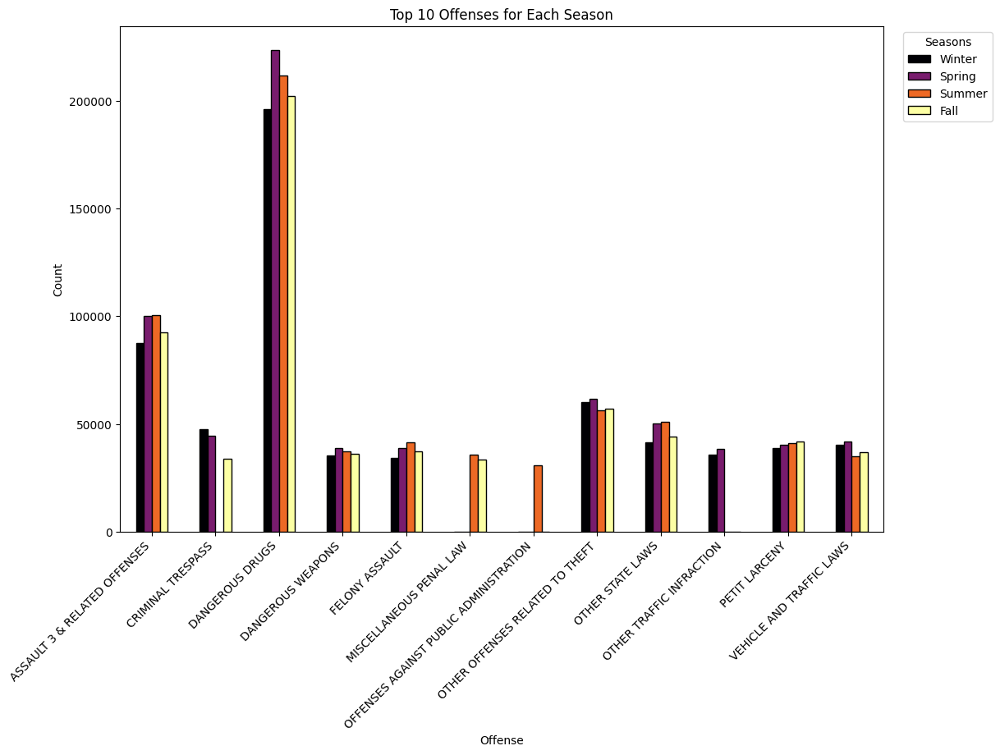

In [36]:
# Define the order of days
day_order = ['Winter', 'Spring', 'Summer', 'Fall']

# Convert 'Day_of_week' to a categorical variable with the specified order
time_crime['Season'] = pd.Categorical(time_crime['Season'], categories=day_order, ordered=True)

# Group by 'Day_of_week' and count occurrences of each offense
offense_counts = time_crime.groupby(['Season', 'ofns_desc']).size().reset_index(name='Count')

# Sort by count in descending order for each day
offense_counts = offense_counts.sort_values(by=['Season', 'Count'], ascending=[True, False])

# Get the top 10 offenses for each day
top_10_offenses = offense_counts.groupby('Season').head(10)

# Pivot the table for easier plotting
pivot_table = top_10_offenses.pivot(index='ofns_desc', columns='Season', values='Count').fillna(0)

# Plotting
ax = pivot_table.plot(kind='bar', figsize=(12, 8), colormap='inferno', edgecolor='black')

# Rotate x-axis labels
plt.xticks(rotation=45, ha='right')

plt.title('Top 10 Offenses for Each Season')
plt.xlabel('Offense')
plt.ylabel('Count')
plt.legend(title='Seasons', loc='upper right', bbox_to_anchor=(1.15, 1))
plt.show()

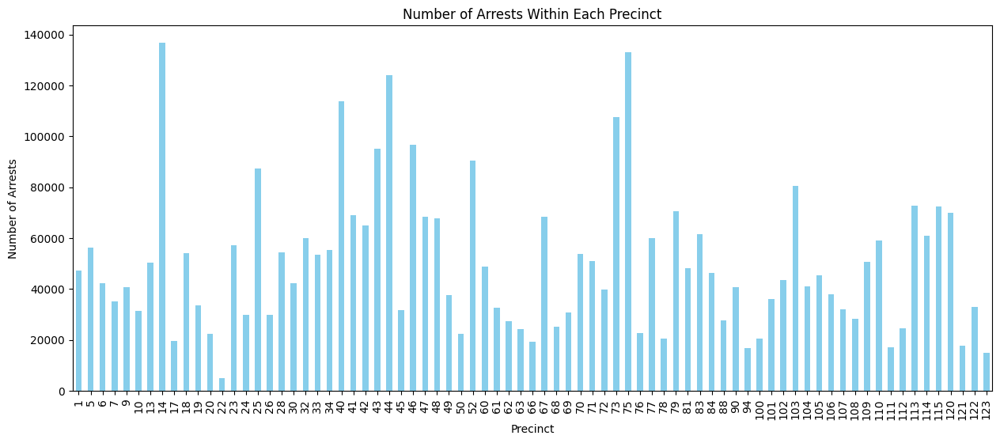

In [37]:
# Group by 'PRECINCT' and count occurrences
precinct_counts = time_crime['arrest_precinct'].value_counts()

# Plot bar chart for number of arrests within each precinct
plt.figure(figsize=(15, 6))
precinct_counts.sort_index().plot(kind='bar', color='skyblue')
plt.xlabel('Precinct')
plt.ylabel('Number of Arrests')
plt.title('Number of Arrests Within Each Precinct')
plt.show()

In [38]:
import folium 

map_cat = folium.Map(location=[40.7128,-73.9060 ],tiles='OpenStreetMap',
 zoom_start=11)
for each in time_crime[:2500].iterrows():
    if each[1]['law_cat_cd'] == 'M':
        folium.CircleMarker([each[1]['latitude'],each[1]['longitude']],
                            radius=2,
                            color='navy',
                            tooltip=str(each[1]['law_cat_cd']),
                            fill_opacity=0.4,
                            opacity=0.4
                            ).add_to(map_cat)
    elif each[1]['law_cat_cd'] == 'F':
        folium.CircleMarker([each[1]['latitude'],each[1]['longitude']],
                            radius=2,
                            color='orange',
                            tooltip=str(each[1]['law_cat_cd']),
                            fill_opacity=0.4,
                            opacity=0.4
                            ).add_to(map_cat)
    elif each[1]['law_cat_cd'] == 'V':
        folium.CircleMarker([each[1]['latitude'],each[1]['longitude']],
                            radius=2,
                            color='green',
                            tooltip=str(each[1]['law_cat_cd']),
                            fill_opacity=0.4,
                            opacity=0.4
                            ).add_to(map_cat)
    elif each[1]['law_cat_cd'] == 'I':
        folium.CircleMarker([each[1]['latitude'],each[1]['longitude']],
                            radius=2,
                            color='red',
                            tooltip=str(each[1]['law_cat_cd']),
                            fill_opacity=0.4,
                            opacity=0.4
                            ).add_to(map_cat)
map_cat

In [39]:
from itertools import cycle
import plotly.express as px

# Group by 'ARREST_PRECINCT' and 'OFNS_DESC' to get counts for each offense in each precinct
offense_counts_by_precinct = time_crime.groupby(['arrest_precinct', 'ofns_desc']).size().unstack(fill_value=0)

# Get the total offenses for each precinct
total_offenses_by_precinct = offense_counts_by_precinct.sum(axis=1)

# Select the top N precincts with the highest total offenses (adjust N as needed)
top_precincts = total_offenses_by_precinct.sort_values(ascending=False).head(20).index

# Create a DataFrame for plotly
plotly_df = pd.DataFrame(columns=['Precinct', 'Offense', 'Count', 'Color'])

color_cycle = cycle(px.colors.qualitative.Set3)  # Using Set3 as a colorblind-friendly palette

for precinct in top_precincts:
    top_offenses = offense_counts_by_precinct.loc[precinct].sort_values(ascending=False).index[:30]
    precinct_data = offense_counts_by_precinct.loc[precinct, top_offenses]
    
    for offense, count in precinct_data.items():
        color = next(color_cycle)
        plotly_df = pd.concat([plotly_df, pd.DataFrame({'Precinct': [str(precinct)], 'Offense': [offense], 'Count': [count], 'Color': [color]})], ignore_index=True)

# Create an interactive bar chart with hover information
fig = px.bar(plotly_df, x='Precinct', y='Count', color='Offense', hover_data=['Offense', 'Count'], color_discrete_sequence=[row['Color'] for _, row in plotly_df.iterrows()],
             title='Top 30 Offense Types in Highest Precincts', labels={'Precinct': 'Precinct Number', 'Count': 'Number of Offenses'},
             color_continuous_scale=px.colors.qualitative.Set3)

# Show the plot
fig.show()

In [40]:
from sklearn.model_selection import train_test_split

In [41]:
X = crime_df.drop(['arrest_precinct'], axis=1)
y = crime_df['arrest_precinct']

In [42]:
X_train, X_test, y_train, y_test = train_test_split (X, y, train_size=0.8, test_size=0.2, random_state=100)

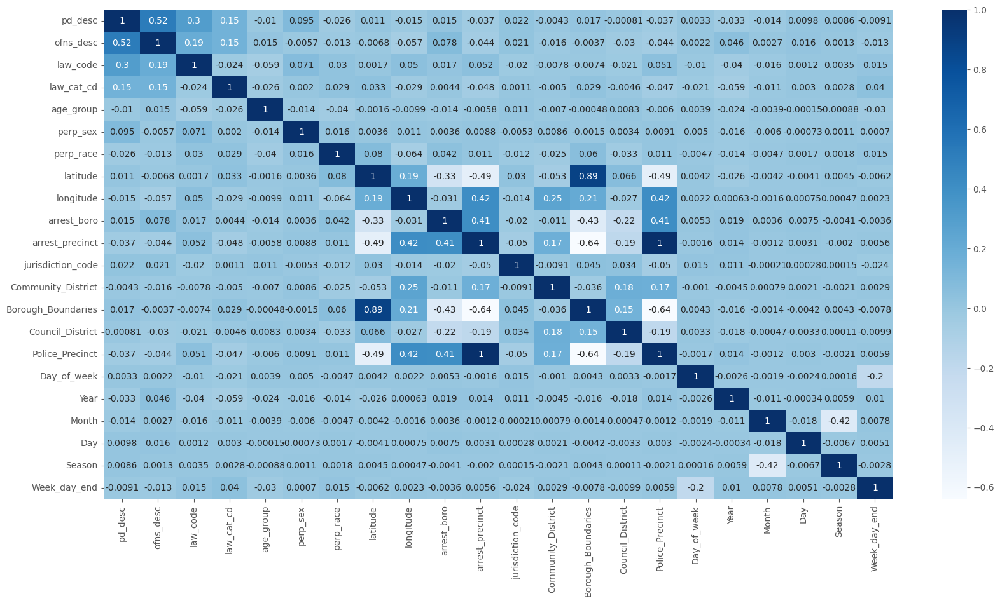

In [43]:
plt.style.use("ggplot")
plt.figure(figsize = (20,10))
sns.heatmap(crime_df.corr(),annot = True,cmap="Blues")
plt.show()

In [44]:
from sklearn.feature_selection import RFE
from sklearn.linear_model import LinearRegression

In [45]:
linreg = LinearRegression()

In [46]:
linreg.fit(X_train, y_train)

LinearRegression()

In [47]:
# RFE
n_features_to_select = 11

rfe = RFE(estimator=linreg, n_features_to_select=n_features_to_select)
rfe.fit(X_train, y_train)

RFE(estimator=LinearRegression(), n_features_to_select=11)

In [48]:
list(zip(X_train.columns,rfe.support_,rfe.ranking_))

[('pd_desc', True, 1),
 ('ofns_desc', False, 2),
 ('law_code', True, 1),
 ('law_cat_cd', True, 1),
 ('age_group', True, 1),
 ('perp_sex', False, 3),
 ('perp_race', False, 4),
 ('latitude', False, 11),
 ('longitude', True, 1),
 ('arrest_boro', True, 1),
 ('jurisdiction_code', True, 1),
 ('Community_District', True, 1),
 ('Borough_Boundaries', True, 1),
 ('Council_District', True, 1),
 ('Police_Precinct', True, 1),
 ('Day_of_week', False, 8),
 ('Year', False, 7),
 ('Month', False, 10),
 ('Day', False, 6),
 ('Season', False, 9),
 ('Week_day_end', False, 5)]

In [49]:
col = X_train.columns[rfe.support_]
col

Index(['pd_desc', 'law_code', 'law_cat_cd', 'age_group', 'longitude',
       'arrest_boro', 'jurisdiction_code', 'Community_District',
       'Borough_Boundaries', 'Council_District', 'Police_Precinct'],
      dtype='object')

In [50]:
X_train.columns[~rfe.support_]

Index(['ofns_desc', 'perp_sex', 'perp_race', 'latitude', 'Day_of_week', 'Year',
       'Month', 'Day', 'Season', 'Week_day_end'],
      dtype='object')

In [51]:
X_train = X_train.drop(['ofns_desc'], axis=1)
X_train = X_train.drop(['perp_sex'], axis=1)
X_train = X_train.drop(['perp_race'], axis=1)
X_train = X_train.drop(['latitude'], axis=1)
X_train = X_train.drop(['Day_of_week'], axis=1)
X_train = X_train.drop(['Year'], axis=1)
X_train = X_train.drop(['Month'], axis=1)
X_train = X_train.drop(['Day'], axis=1)
X_train = X_train.drop(['Season'], axis=1)
X_train = X_train.drop(['Week_day_end'], axis=1)

In [52]:
# 3rd Model
 
import statsmodels.api as sm  
X_train_linreg = sm.add_constant(X_train)

lrm = sm.OLS(y_train, X_train_linreg).fit()

In [53]:
# Display the model summary
lrm.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:        arrest_precinct   R-squared:                       0.996
Model:                            OLS   Adj. R-squared:                  0.996
Method:                 Least Squares   F-statistic:                 7.598e+07
Date:                Tue, 27 Feb 2024   Prob (F-statistic):               0.00
Time:                        13:20:49   Log-Likelihood:             8.2033e+06
No. Observations:             3090118   AIC:                        -1.641e+07
Df Residuals:                 3090106   BIC:                        -1.641e+07
Df Model:                          11                                         
Covariance Type:            nonrobust                                         
======================================================================================
                         coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------
const                 -0.0049   6.27e-05    -78.932      0.000      -0.005      -0.005
pd_desc                0.0001   3.28e-05      4.216      0.000    7.39e-05       0.000
law_code               0.0004    4.6e-05      9.260      0.000       0.000       0.001
law_cat_cd            -0.0010   3.11e-05    -31.436      0.000      -0.001      -0.001
age_group              0.0003   3.56e-05      9.551      0.000       0.000       0.000
longitude              0.0004   6.62e-05      5.585      0.000       0.000       0.000
arrest_boro            0.0043   3.91e-05    110.740      0.000       0.004       0.004
jurisdiction_code      0.0020      0.000     20.053      0.000       0.002       0.002
Community_District     0.0014   3.43e-05     40.765      0.000       0.001       0.001
Borough_Boundaries     0.0029   5.77e-05     49.644      0.000       0.003       0.003
Council_District       0.0016   3.61e-05     43.543      0.000       0.001       0.002
Police_Precinct        0.9986   6.81e-05   1.47e+04      0.000       0.998       0.999
==============================================================================
Omnibus:                  5943660.679   Durbin-Watson:                   2.000
Prob(Omnibus):                  0.000   Jarque-Bera (JB):      28022661543.101
Skew:                          14.790   Prob(JB):                         0.00
Kurtosis:                     468.584   Cond. No.                         20.6
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

## Checking Multicollinearity

In [54]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

In [55]:
vif = pd.DataFrame()
vif['Features'] = X_train.columns
vif['VIF'] = [variance_inflation_factor(X_train.values, i) for i in range(X_train.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
4,longitude,11.08
10,Police_Precinct,10.21
8,Borough_Boundaries,8.67
1,law_code,5.62
9,Council_District,4.69
7,Community_District,4.31
0,pd_desc,4.15
2,law_cat_cd,3.46
5,arrest_boro,3.38
3,age_group,2.11


In [56]:
X_train = X_train.drop(['longitude'], axis=1)

In [57]:
vif = pd.DataFrame()
vif['Features'] = X_train.columns
vif['VIF'] = [variance_inflation_factor(X_train.values, i) for i in range(X_train.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
1,law_code,5.60
9,Police_Precinct,5.11
7,Borough_Boundaries,4.85
8,Council_District,4.62
6,Community_District,4.22
0,pd_desc,4.15
2,law_cat_cd,3.43
4,arrest_boro,3.25
3,age_group,2.10
5,jurisdiction_code,1.05


In [58]:
X_train = X_train.drop(['law_code'], axis=1)

In [59]:
vif = pd.DataFrame()
vif['Features'] = X_train.columns
vif['VIF'] = [variance_inflation_factor(X_train.values, i) for i in range(X_train.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
8,Police_Precinct,4.73
7,Council_District,4.57
6,Borough_Boundaries,4.41
5,Community_District,4.22
0,pd_desc,3.58
1,law_cat_cd,3.43
3,arrest_boro,3.23
2,age_group,2.10
4,jurisdiction_code,1.05


In [60]:
import statsmodels.api as sm  
X_train_linreg = sm.add_constant(X_train)

lrm = sm.OLS(y_train, X_train_linreg).fit()

In [61]:
y_pred = lrm.predict(X_train_linreg)

In [62]:
SS_Residual = np.sum((y_train-y_pred)**2)
SS_Total = np.sum((y_train-np.mean(y_train))**2)
r_squared = 1 - (float(SS_Residual))/SS_Total
adjusted_r_squared = 1 - (1-r_squared)*(len(y_train)-1)/(len(y)-X_train_linreg.shape[1]-1)

In [63]:
r_squared

0.9963162546681548

In [64]:
adjusted_r_squared

0.9970529966772426

Text(0.5, 0, 'Error')

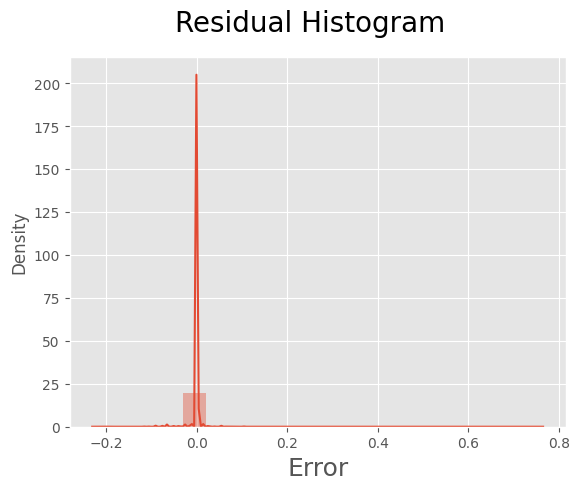

In [65]:
# Plot the histogram of residual
fig = plt.figure()
sns.distplot((y_train - y_pred), bins = 20)
fig.suptitle('Residual Histogram', fontsize = 20)                  # Plot heading 
plt.xlabel('Error', fontsize = 18) 

## Prediction

In [66]:
num_vars_pred = ['Day_of_week', 'Year', 'Month', 'Day', 'pd_desc', 'ofns_desc', 'law_code', 'law_cat_cd', 'age_group', 
            'perp_race', 'longitude', 'arrest_boro','jurisdiction_code','Community_District', 
            'Borough_Boundaries', 'Council_District', 'Police_Precinct','Season', 'Week_day_end']

In [67]:
print("Feature names during fit time:", scaler.get_feature_names_out())
print("Feature names in X_test:", X_test.columns)

Feature names during fit time: ['Day_of_week' 'Year' 'Month' 'Day' 'pd_desc' 'ofns_desc' 'law_code'
 'law_cat_cd' 'age_group' 'perp_race' 'longitude' 'arrest_boro'
 'arrest_precinct' 'jurisdiction_code' 'Community_District'
 'Borough_Boundaries' 'Council_District' 'Police_Precinct' 'Season'
 'Week_day_end']
Feature names in X_test: Index(['pd_desc', 'ofns_desc', 'law_code', 'law_cat_cd', 'age_group',
       'perp_sex', 'perp_race', 'latitude', 'longitude', 'arrest_boro',
       'jurisdiction_code', 'Community_District', 'Borough_Boundaries',
       'Council_District', 'Police_Precinct', 'Day_of_week', 'Year', 'Month',
       'Day', 'Season', 'Week_day_end'],
      dtype='object')


In [68]:
new_scaler = MinMaxScaler()
new_scaler.fit(X_test[num_vars_pred])

MinMaxScaler()

In [69]:
X_test[num_vars_pred] = new_scaler.transform(X_test[num_vars_pred])

In [70]:
# Creating X_test_new dataframe by dropping variables from X_test
X_test_new = X_test[X_train.columns]

# Adding a constant variable 
X_test_new = sm.add_constant(X_test_new)

In [71]:
# Making predictions
y_predict = lrm.predict(X_test_new)

In [72]:
y_predict

3867861    0.144446
1103197    0.393285
3607399    0.237023
2280566    0.341233
859167     0.406931
             ...   
1323255    0.028167
2084102    0.328410
3180403    0.550099
1144708    0.250507
3562370    0.590015
Length: 772530, dtype: float64

In [73]:
y_dt_train = lrm.predict(X_train_linreg)
y_dt_test = lrm.predict(X_test_new)

In [74]:
from sklearn.metrics import mean_squared_error

train_mse = mean_squared_error(y_train, y_dt_train)
test_mse = mean_squared_error(y_test, y_dt_test)
print('Train Mean Squared Error:', train_mse)
print('Test Mean Squared Error: ', test_mse)

Train Mean Squared Error: 0.0002895340382284127
Test Mean Squared Error:  0.0002996816322931527


In [75]:
SS_Residual = np.sum((y_test-y_predict)**2)
SS_Total = np.sum((y_test-np.mean(y_test))**2)
r_squared = 1 - (float(SS_Residual))/SS_Total
adjusted_r_squared = 1 - (1-r_squared)*(len(y_test)-1)/(len(y)-X_test_new.shape[1]-1)

In [76]:
r_squared

0.9961853996015503

In [77]:
adjusted_r_squared

0.999237078340208

## Prediction

In [78]:
X_test_df = pd.DataFrame(X_test)

In [79]:
y_predict_df = pd.DataFrame(y_pred)

In [80]:
y_predict_df.reset_index(drop=True, inplace=True)
X_test_df.reset_index(drop=True, inplace=True)

In [81]:
y_pred_final = pd.concat([X_test_df, y_predict_df],axis=1)

In [82]:
y_pred_final.head(5)

,pd_desc,ofns_desc,law_code,law_cat_cd,age_group,perp_sex,perp_race,latitude,longitude,arrest_boro,jurisdiction_code,Community_District,Borough_Boundaries,Council_District,Police_Precinct,Day_of_week,Year,Month,Day,Season,Week_day_end,0
0,0.908434,0.814433,0.884933,0.666667,0.25,1.0,0.285714,79101.0,0.224511,0.5,0.0,0.271429,0.75,0.18,0.144737,0.833333,0.000000,0.818182,0.066667,0.000000,0.0,0.575021
1,0.156627,0.175258,0.553626,0.666667,0.25,0.0,1.000000,95377.0,0.587007,0.0,0.0,0.485714,1.00,0.42,0.394737,0.833333,0.692308,0.636364,0.800000,0.666667,0.0,0.894338
2,0.156627,0.175258,0.553626,0.666667,0.25,1.0,1.000000,89559.0,0.338605,0.5,0.0,0.514286,0.75,0.44,0.236842,0.833333,0.076923,0.636364,0.200000,0.666667,0.0,0.830593
3,0.469880,0.835052,0.376465,0.666667,0.00,1.0,0.285714,92999.0,0.499022,0.0,0.0,0.700000,1.00,0.56,0.342105,0.333333,0.384615,0.727273,0.766667,0.000000,1.0,0.695673
4,0.532530,0.175258,0.599218,0.666667,1.00,1.0,0.428571,96968.0,0.689001,0.0,0.0,0.828571,1.00,0.22,0.407895,0.333333,0.769231,0.545455,0.733333,0.666667,1.0,0.603115


In [83]:
y_pred_final= y_pred_final.rename(columns={ 0 : 'Arrest_Precinct_Prob'})
y_pred_final.head(5)

,pd_desc,ofns_desc,law_code,law_cat_cd,age_group,perp_sex,perp_race,latitude,longitude,arrest_boro,jurisdiction_code,Community_District,Borough_Boundaries,Council_District,Police_Precinct,Day_of_week,Year,Month,Day,Season,Week_day_end,Arrest_Precinct_Prob
0,0.908434,0.814433,0.884933,0.666667,0.25,1.0,0.285714,79101.0,0.224511,0.5,0.0,0.271429,0.75,0.18,0.144737,0.833333,0.000000,0.818182,0.066667,0.000000,0.0,0.575021
1,0.156627,0.175258,0.553626,0.666667,0.25,0.0,1.000000,95377.0,0.587007,0.0,0.0,0.485714,1.00,0.42,0.394737,0.833333,0.692308,0.636364,0.800000,0.666667,0.0,0.894338
2,0.156627,0.175258,0.553626,0.666667,0.25,1.0,1.000000,89559.0,0.338605,0.5,0.0,0.514286,0.75,0.44,0.236842,0.833333,0.076923,0.636364,0.200000,0.666667,0.0,0.830593
3,0.469880,0.835052,0.376465,0.666667,0.00,1.0,0.285714,92999.0,0.499022,0.0,0.0,0.700000,1.00,0.56,0.342105,0.333333,0.384615,0.727273,0.766667,0.000000,1.0,0.695673
4,0.532530,0.175258,0.599218,0.666667,1.00,1.0,0.428571,96968.0,0.689001,0.0,0.0,0.828571,1.00,0.22,0.407895,0.333333,0.769231,0.545455,0.733333,0.666667,1.0,0.603115
